# 日本語DNN音声合成システムの実装

## 0.準備

In [1]:
!python -VV

Python 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]


In [2]:
%%capture
try:
    import ttslearn
except ImportError:
    !pip install ttslearn

In [3]:
import ttslearn
ttslearn.__version__

'0.2.2'

## 1.日本語音声合成システムの実装

### 学習済みモデルを用いた音声合成

In [4]:
from ttslearn.dnntts import DNNTTS
from IPython.display import Audio

engine = DNNTTS()
wav, sr = engine.tts("深層学習に基づく音声合成システムです。")
Audio(wav, rate=sr)

The use of pre-trained models is permitted for non-commercial use only.
Please visit https://github.com/r9y9/ttslearn to confirm the license.
Downloading: "https://github.com/r9y9/ttslearn/releases/download/v0.2.0/dnntts.tar.gz"


dnntts.tar.gz: 0.00B [00:00, ?B/s]

Downloading: "https://github.com/r9y9/open_jtalk/releases/download/v1.11.1/open_jtalk_dic_utf_8-1.11.tar.gz"


  0%|          | 0/23646843 [00:00<?, ?it/s]

Extracting tar file


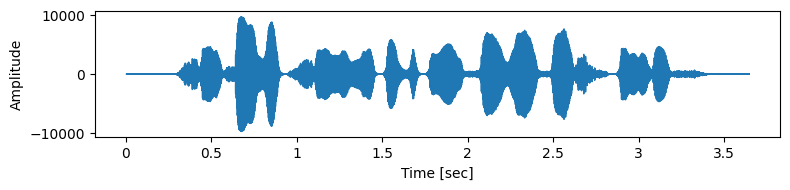

In [5]:
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(8,2))
librosa.display.waveshow(wav.astype(np.float32), sr=sr, ax=ax)
ax.set_xlabel("Time [sec]")
ax.set_ylabel("Amplitude")
plt.tight_layout()

### レシピ実行の前準備

In [6]:
%%capture
from ttslearn.env import is_colab
from os.path import exists

# pip install ttslearn ではレシピはインストールされないので、手動でダウンロード
if is_colab() and not exists("recipes.zip"):
    !curl -LO https://github.com/r9y9/ttslearn/releases/download/v{ttslearn.__version__}/recipes.zip
    !unzip -o recipes.zip

In [7]:
import os
# recipeのディレクトリに移動
cwd = os.getcwd()
if cwd.endswith("notebooks"):
    os.chdir("../recipes/dnntts/")
elif is_colab():
    os.chdir("recipes/dnntts/")

In [8]:
!pwd

/content/recipes/dnntts


In [9]:
import time
start_time = time.time()

### パッケージのインポート

In [10]:
%pylab inline
%load_ext autoreload
%load_ext tensorboard
%autoreload
import IPython
from IPython.display import Audio
import tensorboard as tb
import os

Populating the interactive namespace from numpy and matplotlib


In [11]:
# 数値演算
import numpy as np
import torch
from torch import nn
# 音声波形の読み込み
from scipy.io import wavfile
# フルコンテキストラベル、質問ファイルの読み込み
from nnmnkwii.io import hts
# 音声分析
import pysptk
import pyworld
# 音声分析、可視化
import librosa
import librosa.display
import pandas as pd
import ttslearn

In [12]:
# シードの固定
from ttslearn.util import init_seed
init_seed(773)

In [13]:
torch.__version__

'2.6.0+cu124'

### 描画周りの設定

In [14]:
from ttslearn.notebook import get_cmap, init_plot_style, savefig
cmap = get_cmap()
init_plot_style()

### レシピの設定

In [15]:
# run.shを利用した学習スクリプトをnotebookから行うので、True
run_sh = is_colab()

# CUDA
# NOTE: run.shの引数として渡すので、boolではなく文字列で定義しています
cudnn_benchmark = "true"
cudnn_deterministic = "false"

# 特徴抽出時の並列処理のジョブ数
n_jobs = os.cpu_count()//2

# 継続長モデルの設定ファイル名
duration_config_name="duration_dnn"
# 音響モデルの設定ファイル名
acoustic_config_name="acoustic_dnn_sr16k"

# 継続長モデル & 音響モデル学習におけるバッチサイズ
batch_size = 32
# 継続長モデル & 音響モデル学習におけるエポック数
# 注意: 計算時間を少なくするために、やや少なく設定
nepochs = 10

# run.sh経由で実行するスクリプトのtqdm
run_sh_tqdm = "none"

In [16]:
# ノートブックで利用するテスト用の発話（学習データ、評価データ）
train_utt = "BASIC5000_0001"
test_utt = "BASIC5000_5000"

### Tensorboardによるログの可視化

In [17]:
# ノートブック上から tensorboard のログを確認する
if is_colab():
    %tensorboard --logdir tensorboard/

<IPython.core.display.Javascript object>

## 2.プログラム実装の前準備

### stage -1: コーパスのダウンロード

In [18]:
if is_colab():
  ! ./run.sh --stage -1 --stop-stage -1

ストリーミング出力は最後の 5000 行に切り捨てられました。
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2714.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2715.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2716.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2717.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2718.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2719.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2720.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2721.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2722.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2723.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2724.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2725.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2726.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2727.lab  
  inflating: jsut-lab-0.1.1/basic5000/lab/BASIC5000_2728.lab  
  inflating: jsut-lab-0

### stage 0: 学習/検証/評価データの分割

In [19]:
if run_sh:
    ! ./run.sh --stage 0 --stop-stage 0

stage 0: Data preparation
train/dev/eval split


In [20]:
! ls data/

dev.list  eval.list  train.list  utt_list.txt


In [21]:
! head data/dev.list

BASIC5000_4574
BASIC5000_4575
BASIC5000_4576
BASIC5000_4578
BASIC5000_4579
BASIC5000_4580
BASIC5000_4582
BASIC5000_4583
BASIC5000_4584
BASIC5000_4585


## 3.継続長モデルのための前処理

### 継続長モデルのための1発話に対する前処理

In [22]:
import ttslearn
from nnmnkwii.io import hts
from nnmnkwii.frontend import merlin as fe

# 言語特徴量の抽出に使うための質問ファイル
binary_dict, numeric_dict = hts.load_question_set(ttslearn.util.example_qst_file())

# 音声のフルコンテキストラベルを読み込む
labels = hts.load(ttslearn.util.example_label_file())

# 継続長モデルの入力：言語特徴量
in_feats = fe.linguistic_features(labels, binary_dict, numeric_dict)

# 継続長モデルの出力：音素継続長
out_feats = fe.duration_features(labels)

In [23]:
print("入力特徴量のサイズ:", in_feats.shape)
print("出力特徴量のサイズ:", out_feats.shape)

入力特徴量のサイズ: (44, 325)
出力特徴量のサイズ: (44, 1)


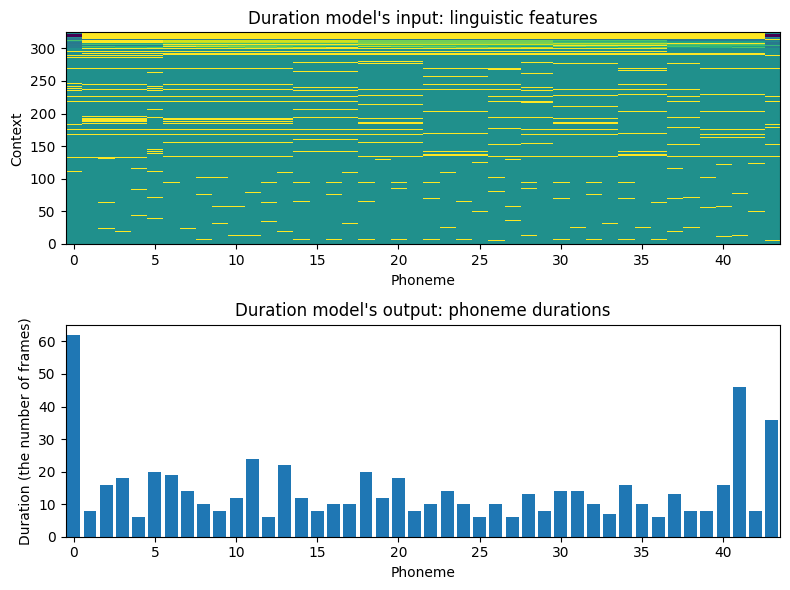

In [24]:
# 可視化用に正規化
in_feats_norm = in_feats / np.maximum(1, np.abs(in_feats).max(0))
fig, ax = plt.subplots(2, 1, figsize=(8,6))
ax[0].set_title("Duration model's input: linguistic features")
ax[1].set_title("Duration model's output: phoneme durations")
ax[0].imshow(in_feats_norm.T, aspect="auto", interpolation="nearest", origin="lower", cmap=cmap)
ax[0].set_ylabel("Context")

ax[1].bar(np.arange(len(out_feats)), out_feats.reshape(-1))

for a in ax:
    a.set_xlim(-0.5, len(in_feats)-0.5)
    a.set_xlabel("Phoneme")
ax[1].set_ylabel("Duration (the number of frames)")
plt.tight_layout()

# 図6-3（継続長モデルの入力と出力の可視化）
savefig("fig/dnntts_impl_duration_inout")

### レシピのstage1の実行

In [25]:
# 全データに対して「音素単位の言語特徴量」と「音素単位の継続長」を抽出
if run_sh:
    ! ./run.sh --stage 1 --stop-stage 1 --n-jobs $n_jobs

stage 1: Feature generation for duration model
+ python preprocess_duration.py data/train.list downloads/jsut_ver1.1/basic5000/lab/ ../common/qst1.hed dump/jsut_sr16000/org/train --n_jobs 1
100% 3133/3133 [00:51<00:00, 61.22it/s]
+ set +x
+ python preprocess_duration.py data/dev.list downloads/jsut_ver1.1/basic5000/lab/ ../common/qst1.hed dump/jsut_sr16000/org/dev --n_jobs 1
100% 200/200 [00:02<00:00, 83.54it/s]
+ set +x
+ python preprocess_duration.py data/eval.list downloads/jsut_ver1.1/basic5000/lab/ ../common/qst1.hed dump/jsut_sr16000/org/eval --n_jobs 1
100% 100/100 [00:01<00:00, 74.33it/s]
+ set +x


## 4.音響モデルのための前処理

### 音響モデルのための 1 発話に対する前処理

In [26]:
from ttslearn.dsp import world_spss_params

# 言語特徴量の抽出に使うための質問ファイル
binary_dict, numeric_dict = hts.load_question_set(ttslearn.util.example_qst_file())

# 音声のフルコンテキストラベルを読み込む
labels = hts.load(ttslearn.util.example_label_file())

# 音響モデルの入力：言語特徴量
in_feats = fe.linguistic_features(labels, binary_dict, numeric_dict, add_frame_features=True, subphone_features="coarse_coding")

# 音声の読み込み
_sr, x = wavfile.read(ttslearn.util.example_audio_file())
sr = 16000
x = (x / 32768).astype(np.float64)
x = librosa.resample(x, orig_sr=_sr, target_sr=sr)

# 音響モデルの出力：音響特徴量
out_feats = world_spss_params(x, sr)

# フレーム数の調整
import builtins # minとmax関数が上書きされていたため標準に戻す
max = builtins.max
min = builtins.min
minL = min(in_feats.shape[0], out_feats.shape[0])
in_feats, out_feats = in_feats[:minL], out_feats[:minL]

# 冒頭と末尾の非音声区間の長さを調整
assert "sil" in labels.contexts[0] and "sil" in labels.contexts[-1]
start_frame = int(labels.start_times[1] / 50000)
end_frame = int(labels.end_times[-2] / 50000)

# 冒頭：50 ミリ秒、末尾：100 ミリ秒
start_frame = max(0, start_frame - int(0.050 / 0.005))
end_frame = min(minL, end_frame + int(0.100 / 0.005))

in_feats = in_feats[start_frame:end_frame]
out_feats = out_feats[start_frame:end_frame]

In [27]:
print("入力特徴量のサイズ:", in_feats.shape)
print("出力特徴量のサイズ:", out_feats.shape)

入力特徴量のサイズ: (568, 329)
出力特徴量のサイズ: (568, 127)


### 音響特徴量を分離して確認

In [28]:
from ttslearn.dnntts.multistream import get_static_features

sr = 16000
hop_length = int(sr * 0.005)
alpha = pysptk.util.mcepalpha(sr)
fft_size = pyworld.get_cheaptrick_fft_size(sr)

# 動的特徴量を除いて、各音響特徴量を取り出す
mgc, lf0, vuv, bap = get_static_features(
    out_feats, num_windows=3, stream_sizes=[120, 3, 1, 3],
    has_dynamic_features=[True, True, False, True])
print("メルケプストラムのサイズ:", mgc.shape)
print("連続対数基本周波数のサイズ:", lf0.shape)
print("有声/無声フラグのサイズ:", vuv.shape)
print("帯域非周期性指標のサイズ:", bap.shape)

メルケプストラムのサイズ: (568, 40)
連続対数基本周波数のサイズ: (568, 1)
有声/無声フラグのサイズ: (568, 1)
帯域非周期性指標のサイズ: (568, 1)


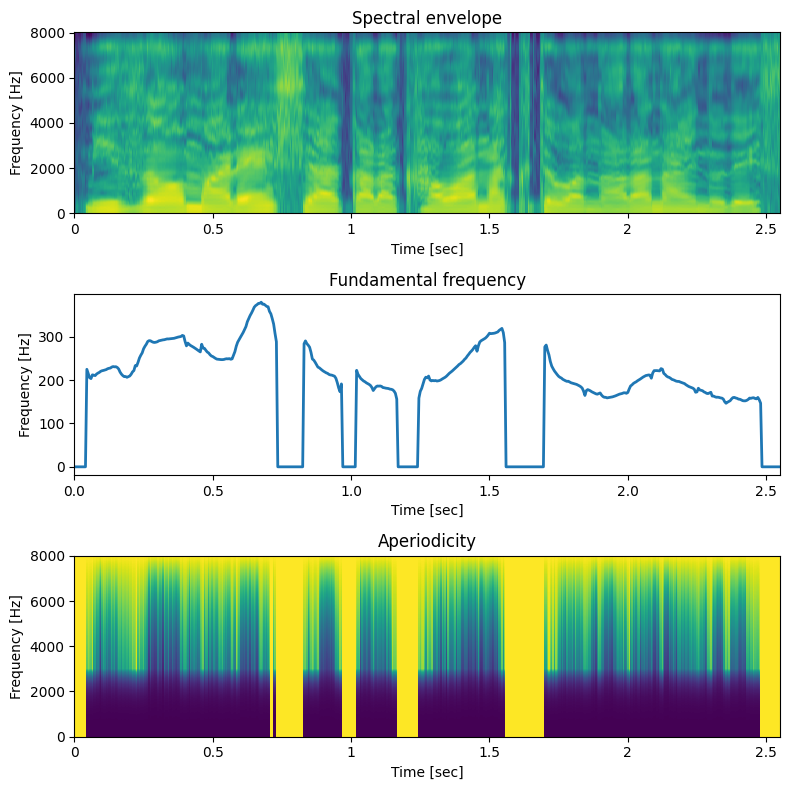

In [29]:
def vis_out_feats(mgc, lf0, vuv, bap):
    fig, ax = plt.subplots(3, 1, figsize=(8,8))
    ax[0].set_title("Spectral envelope")
    ax[1].set_title("Fundamental frequency")
    ax[2].set_title("Aperiodicity")

    logsp = np.log(pysptk.mc2sp(mgc, alpha, fft_size))
    librosa.display.specshow(logsp.T, sr=sr, hop_length=hop_length, x_axis="time", y_axis="hz", cmap=cmap, ax=ax[0])

    timeaxis = np.arange(len(lf0)) * 0.005
    f0 = np.exp(lf0)
    f0[vuv < 0.5] = 0
    ax[1].plot(timeaxis, f0, linewidth=2)
    ax[1].set_xlim(0, len(f0)*0.005)

    aperiodicity = pyworld.decode_aperiodicity(bap.astype(np.float64), sr, fft_size)
    librosa.display.specshow(aperiodicity.T, sr=sr, hop_length=hop_length, x_axis="time", y_axis="hz", cmap=cmap, ax=ax[2])

    for a in ax:
        a.set_xlabel("Time [sec]")
        a.set_ylabel("Frequency [Hz]")
        # 末尾の非音声区間を除く
        a.set_xlim(0, 2.55)

    plt.tight_layout()

# 音響特徴量の可視化
vis_out_feats(mgc, lf0, vuv, bap)
# 図6-4
savefig("./fig/dnntts_impl_acoustic_out_feats")

### 音響モデルの入力と出力の可視化

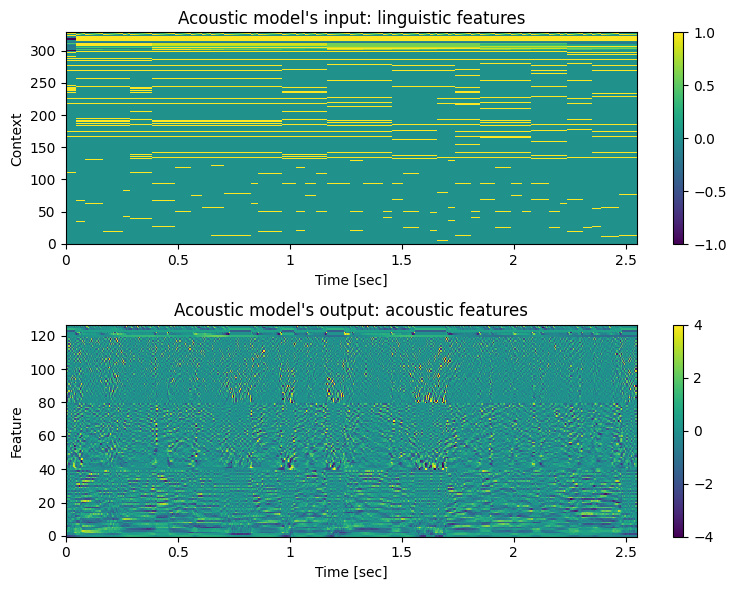

In [30]:
# 可視化用に正規化
from scipy.stats import zscore

in_feats_norm = in_feats / np.maximum(1, np.abs(in_feats).max(0))
out_feats_norm = zscore(out_feats)

fig, ax = plt.subplots(2, 1, figsize=(8,6))
ax[0].set_title("Acoustic model's input: linguistic features")
ax[1].set_title("Acoustic model's output: acoustic features")
mesh = librosa.display.specshow(
    in_feats_norm.T, sr=sr, hop_length=hop_length, x_axis="time", y_axis="frames", ax=ax[0], cmap=cmap)
fig.colorbar(mesh, ax=ax[0])
mesh = librosa.display.specshow(
    out_feats_norm.T, sr=sr, hop_length=hop_length, x_axis="time", y_axis="frames",ax=ax[1], cmap=cmap)
# NOTE: 実際には [-4, 4]の範囲外の値もあるが、視認性のために [-4, 4]に設定
mesh.set_clim(-4, 4)
fig.colorbar(mesh, ax=ax[1])

ax[0].set_ylabel("Context")
ax[1].set_ylabel("Feature")

for a in ax:
    a.set_xlabel("Time [sec]")
    # 末尾の非音声区間を除く
    a.set_xlim(0, 2.55)

plt.tight_layout()

### レシピのstage2の実行
すべてのデータに対して「フレーム単位の言語特徴量」と「フレーム単位の音響特徴量」を抽出

In [34]:
if run_sh:
    ! ./run.sh --stage 2 --stop-stage 2 --n-jobs $n_jobs

stage 2: Feature generation for acoustic model
+ python preprocess_acoustic.py data/train.list downloads/jsut_ver1.1/basic5000/wav/ downloads/jsut_ver1.1/basic5000/lab/ ../common/qst1.hed dump/jsut_sr16000/org/train --sample_rate 16000 --n_jobs 1
100% 3133/3133 [35:31<00:00,  1.47it/s]
+ set +x
+ python preprocess_acoustic.py data/dev.list downloads/jsut_ver1.1/basic5000/wav/ downloads/jsut_ver1.1/basic5000/lab/ ../common/qst1.hed dump/jsut_sr16000/org/dev --sample_rate 16000 --n_jobs 1
100% 200/200 [01:52<00:00,  1.78it/s]
+ set +x
+ python preprocess_acoustic.py data/eval.list downloads/jsut_ver1.1/basic5000/wav/ downloads/jsut_ver1.1/basic5000/lab/ ../common/qst1.hed dump/jsut_sr16000/org/eval --sample_rate 16000 --n_jobs 1
100% 100/100 [00:53<00:00,  1.86it/s]
+ set +x


## 5.特徴量の正規化

### レシピのstage3の実行
継続長モデル用の入力、出力特徴量、音響モデル用の入力、出力特徴量すべてを正規化

In [35]:
if run_sh:
    ! ./run.sh --stage 3 --stop-stage 3 --n-jobs $n_jobs

stage 3: feature normalization
+ python ../common/fit_scaler.py data/train.list dump/jsut_sr16000/org/train/in_duration dump/jsut_sr16000/org/in_duration_scaler.joblib
3133it [00:03, 964.44it/s]
+ set +x
+ python ../common/fit_scaler.py data/train.list dump/jsut_sr16000/org/train/out_duration dump/jsut_sr16000/org/out_duration_scaler.joblib
3133it [00:01, 1916.61it/s]
+ set +x
+ python ../common/fit_scaler.py data/train.list dump/jsut_sr16000/org/train/in_acoustic dump/jsut_sr16000/org/in_acoustic_scaler.joblib
3133it [00:23, 133.12it/s]
+ set +x
+ python ../common/fit_scaler.py data/train.list dump/jsut_sr16000/org/train/out_acoustic dump/jsut_sr16000/org/out_acoustic_scaler.joblib
3133it [00:09, 337.23it/s]
+ set +x
'dump/jsut_sr16000/org/in_acoustic_scaler.joblib' -> 'dump/jsut_sr16000/norm/in_acoustic_scaler.joblib'
'dump/jsut_sr16000/org/in_duration_scaler.joblib' -> 'dump/jsut_sr16000/norm/in_duration_scaler.joblib'
'dump/jsut_sr16000/org/out_acoustic_scaler.joblib' -> 'dump/jsut

### 正規化の処理の結果の確認

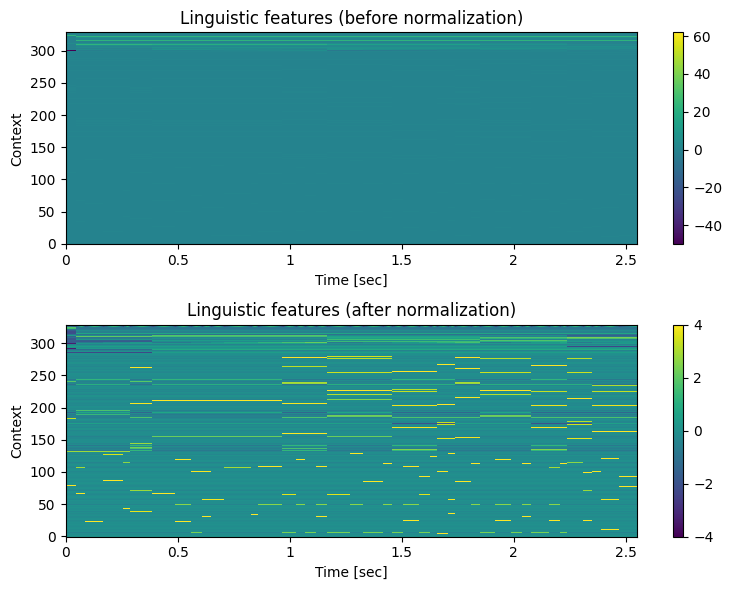

In [36]:
# 言語特徴量の正規化前後
in_feats = np.load(f"dump/jsut_sr16000/org/train/in_acoustic/{train_utt}-feats.npy")
in_feats_norm = np.load(f"dump/jsut_sr16000/norm/train/in_acoustic/{train_utt}-feats.npy")
fig, ax = plt.subplots(2, 1, figsize=(8,6))
ax[0].set_title("Linguistic features (before normalization)")
ax[1].set_title("Linguistic features (after normalization)")
mesh = librosa.display.specshow(
    in_feats.T, sr=sr, hop_length=hop_length, x_axis="time", y_axis="frames", ax=ax[0], cmap=cmap)
fig.colorbar(mesh, ax=ax[0])
mesh = librosa.display.specshow(
    in_feats_norm.T, sr=sr, hop_length=hop_length, x_axis="time", y_axis="frames",ax=ax[1], cmap=cmap)
# NOTE: 実際には [-4, 4]の範囲外の値もあるが、視認性のために [-4, 4]に設定
mesh.set_clim(-4, 4)
fig.colorbar(mesh, ax=ax[1])

for a in ax:
    a.set_xlabel("Time [sec]")
    a.set_ylabel("Context")
    # 末尾の非音声区間を除く
    a.set_xlim(0, 2.55)
plt.tight_layout()
# 図6-5（正規化前後のフレーム単位の言語特徴量）
savefig("./fig/dnntts_impl_in_feats_norm")

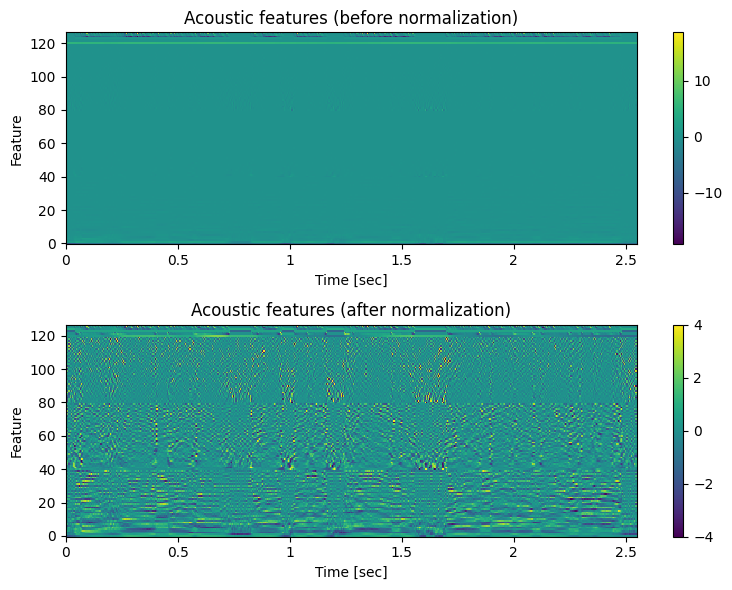

In [37]:
# 音響特徴量の正規化前後
out_feats = np.load(f"dump/jsut_sr16000/org/train/out_acoustic/{train_utt}-feats.npy")
out_feats_norm = np.load(f"dump/jsut_sr16000/norm/train/out_acoustic/{train_utt}-feats.npy")
fig, ax = plt.subplots(2, 1, figsize=(8,6))
ax[0].set_title("Acoustic features (before normalization)")
ax[1].set_title("Acoustic features (after normalization)")
mesh = librosa.display.specshow(
    out_feats.T, sr=sr, hop_length=hop_length, x_axis="time", y_axis="frames", ax=ax[0], cmap=cmap)
fig.colorbar(mesh, ax=ax[0])
mesh = librosa.display.specshow(
    out_feats_norm.T, sr=sr, hop_length=hop_length, x_axis="time", y_axis="frames",ax=ax[1], cmap=cmap)
# NOTE: 実際には [-4, 4]の範囲外の値もあるが、視認性のために [-4, 4]に設定
mesh.set_clim(-4, 4)
fig.colorbar(mesh, ax=ax[1])

for a in ax:
    a.set_xlabel("Time [sec]")
    a.set_ylabel("Feature")
    # 末尾の非音声区間を除く
    a.set_xlim(0, 2.55)
plt.tight_layout()

## 6.ニューラルネットワークの実装

### 全結合型ニューラルネットワーク

In [38]:
class DNN(nn.Module):
    def __init__(self, in_dim, hidden_dim, out_dim, num_layers=2):
        super(DNN, self).__init__()
        model = [nn.Linear(in_dim, hidden_dim), nn.ReLU()]
        for _ in range(num_layers):
            model.append(nn.Linear(hidden_dim, hidden_dim))
            model.append(nn.ReLU())
        model.append(nn.Linear(hidden_dim, out_dim))
        self.model = nn.Sequential(*model)

    def forward(self, x, lens=None):
        return self.model(x)

In [39]:
DNN(in_dim=325, hidden_dim=64, out_dim=1, num_layers=2)

DNN(
  (model): Sequential(
    (0): Linear(in_features=325, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=64, bias=True)
    (3): ReLU()
    (4): Linear(in_features=64, out_features=64, bias=True)
    (5): ReLU()
    (6): Linear(in_features=64, out_features=1, bias=True)
  )
)

### LSTM-RNN

In [40]:
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence

class LSTMRNN(nn.Module):
    def __init__(
        self, in_dim, hidden_dim, out_dim, num_layers=1, bidirectional=True, dropout=0.0
    ):
        super(LSTMRNN, self).__init__()
        self.num_layers = num_layers
        num_direction = 2 if bidirectional else 1
        self.lstm = nn.LSTM(
            in_dim,
            hidden_dim,
            num_layers,
            bidirectional=bidirectional,
            batch_first=True,
            dropout=dropout,
        )
        self.hidden2out = nn.Linear(num_direction * hidden_dim, out_dim)

    def forward(self, seqs, lens):
        seqs = pack_padded_sequence(seqs, lens, batch_first=True)
        out, _ = self.lstm(seqs)
        out, _ = pad_packed_sequence(out, batch_first=True)
        out = self.hidden2out(out)
        return out

In [41]:
LSTMRNN(in_dim=325, hidden_dim=64, out_dim=1, num_layers=2)

LSTMRNN(
  (lstm): LSTM(325, 64, num_layers=2, batch_first=True, bidirectional=True)
  (hidden2out): Linear(in_features=128, out_features=1, bias=True)
)

## 7.学習スクリプトの実装

### DataLoaderの実装

In [42]:
# Datasetクラスの定義
from torch.utils import data as data_utils

class Dataset(data_utils.Dataset):
    def __init__(self, in_paths, out_paths):
        self.in_paths = in_paths
        self.out_paths = out_paths

    def __getitem__(self, idx):
        return np.load(self.in_paths[idx]), np.load(self.out_paths[idx])

    def __len__(self):
        return len(self.in_paths)

In [43]:
# DataLoaderの利用例
from pathlib import Path
from ttslearn.util import pad_2d

def collate_fn_dnntts(batch):
    lengths = [len(x[0]) for x in batch]
    max_len = max(lengths)
    x_batch = torch.stack([torch.from_numpy(pad_2d(x[0], max_len)) for x in batch])
    y_batch = torch.stack([torch.from_numpy(pad_2d(x[1], max_len)) for x in batch])
    lengths = torch.tensor(lengths, dtype=torch.long)
    return x_batch, y_batch, lengths


in_paths = sorted(Path("./dump/jsut_sr16000/norm/dev/in_duration/").glob("*.npy"))
out_paths = sorted(Path("./dump/jsut_sr16000/norm/dev/out_duration/").glob("*.npy"))

dataset = Dataset(in_paths, out_paths)
data_loader = data_utils.DataLoader(dataset, batch_size=8, collate_fn=collate_fn_dnntts, num_workers=0)

in_feats, out_feats, lengths = next(iter(data_loader))

print("入力特徴量のサイズ:", tuple(in_feats.shape))
print("出力特徴量のサイズ:", tuple(out_feats.shape))
print("系列長のサイズ:", tuple(lengths.shape))

入力特徴量のサイズ: (8, 86, 325)
出力特徴量のサイズ: (8, 86, 1)
系列長のサイズ: (8,)


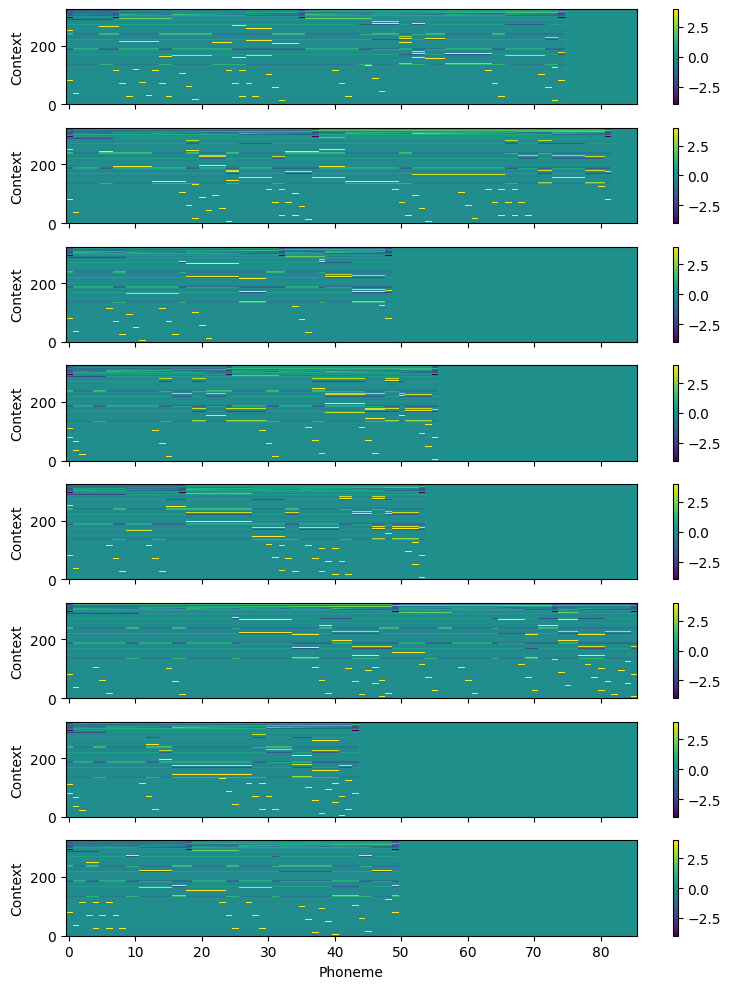

In [44]:
# ミニバッチの可視化（ゼロパディングされていることを確認）
fig, ax = plt.subplots(len(in_feats), 1, figsize=(8,10), sharex=True, sharey=True)
for n in range(len(in_feats)):
    x = in_feats[n].data.numpy()
    mesh = ax[n].imshow(x.T, aspect="auto", interpolation="nearest", origin="lower", cmap=cmap)
    fig.colorbar(mesh, ax=ax[n])
    # NOTE: 実際には [-4, 4]の範囲外の値もあるが、視認性のために [-4, 4]に設定
    mesh.set_clim(-4, 4)

ax[-1].set_xlabel("Phoneme")
for a in ax:
    a.set_ylabel("Context")
plt.tight_layout()

# 図6-6（継続長モデルの入力である、音素単位の言語特徴量）
savefig("fig/dnntts_impl_minibatch")

### 学習の前準備

In [45]:
from ttslearn.dnntts import DNN
from torch import optim

model = DNN(in_dim=325, hidden_dim=64, out_dim=1, num_layers=2)

# lr は学習率
optimizer = optim.Adam(model.parameters(), lr=0.01)

# gamma は学習率の減衰係数
lr_scheduler = optim.lr_scheduler.StepLR(optimizer, gamma=0.5, step_size=10)

### 学習ループの実装

In [46]:
# DataLoader を用いたミニバッチの作成: ミニバッチ毎に処理する
for in_feats, out_feats, lengths in data_loader:
    # 順伝播の計算
    pred_out_feats = model(in_feats, lengths)
    # 損失の計算
    loss = nn.MSELoss()(pred_out_feats, out_feats)
    # 損失の値を出力
    print(loss.item())
    # optimizer に蓄積された勾配をリセット
    optimizer.zero_grad()
    # 誤差の逆伝播の計算
    loss.backward()
    # パラメータの更新
    optimizer.step()

0.5847609043121338
0.6096929907798767
0.7466080784797668
0.2730913758277893
0.44654127955436707
0.2554619014263153
0.27791279554367065
0.5924186706542969
0.2424875795841217
0.4017272889614105
0.18745973706245422
0.16529333591461182
0.21711350977420807
0.2085885852575302
0.1573624312877655
0.16600747406482697
0.24657705426216125
0.16559934616088867
0.13827231526374817
0.3043404221534729
0.4748716950416565
1.1685540676116943
0.19969134032726288
0.24324041604995728
0.2931642234325409


In [47]:
# hydra を用いた学習スクリプトの設定ファイル
! cat conf/train_dnntts/config.yaml

# @package _global_

defaults:
  - model: duration_dnn

verbose: 100
seed: 773

# 1) none 2) tqdm
tqdm: tqdm

cudnn:
  benchmark: true
  deterministic: false

# Multi-gpu
data_parallel: false

###########################################################
#                DATA SETTING                             #
###########################################################
data:
  # training set
  train:
    utt_list: data/train.list
    in_dir:
    out_dir:

  # development set
  dev:
    utt_list: data/dev.list
    in_dir:
    out_dir:

  # data loader
  num_workers: 4
  batch_size: 32

###########################################################
#                TRAIN SETTING                            #
###########################################################
train:
  out_dir: exp
  log_dir: tensorboard/exp

  max_train_steps: -1
  nepochs: 30
  checkpoint_epoch_interval: 10

  optim:
    optimizer:
      name: Adam
      params:
        lr: 0.001
        betas: [0.9, 0.999]
       

## 8.継続長モデルの学習

### 継続長モデルの設定ファイル

In [48]:
! cat conf/train_dnntts/model/{duration_config_name}.yaml

netG:
  _target_: ttslearn.dnntts.DNN
  in_dim: 325
  out_dim: 1
  hidden_dim: 64
  num_layers: 2

stream_sizes: [1]
has_dynamic_features: [false]


### 継続長モデルのインスタンス化

In [49]:
import hydra
from omegaconf import OmegaConf
hydra.utils.instantiate(OmegaConf.load(f"conf/train_dnntts/model/{duration_config_name}.yaml").netG)

DNN(
  (model): Sequential(
    (0): Linear(in_features=325, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=64, bias=True)
    (3): ReLU()
    (4): Linear(in_features=64, out_features=64, bias=True)
    (5): ReLU()
    (6): Linear(in_features=64, out_features=1, bias=True)
  )
)

### レシピの stage 4 の実行
hydraを用いた学習スクリプトを実行し継続長モデルを学習する

In [50]:
if run_sh:
    ! ./run.sh --stage 4 --stop-stage 4 --duration-model $duration_config_name \
    --tqdm $run_sh_tqdm --dnntts-data-batch-size $batch_size --dnntts-train-nepochs $nepochs \
    --cudnn-benchmark $cudnn_benchmark --cudnn-deterministic $cudnn_deterministic

stage 4: Training duration model
+ python train_dnntts.py model=duration_dnn tqdm=none data.train.utt_list=data/train.list data.train.in_dir=dump/jsut_sr16000/norm/train/in_duration/ data.train.out_dir=dump/jsut_sr16000/norm/train/out_duration/ data.dev.utt_list=data/dev.list data.dev.in_dir=dump/jsut_sr16000/norm/dev/in_duration/ data.dev.out_dir=dump/jsut_sr16000/norm/dev/out_duration/ train.out_dir=exp/jsut_sr16000/duration_dnn train.log_dir=tensorboard/jsut_sr16000_duration_dnn train.nepochs=10 data.batch_size=32 cudnn.benchmark=true cudnn.deterministic=false
2025-06-22 14:12:04.353896: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750601524.598007   16595 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750601524.667117   16595 cuda_bl

## 9.音響モデルの学習

### 音響モデルの設定ファイル

In [51]:
! cat conf/train_dnntts/model/{acoustic_config_name}.yaml

netG:
  _target_: ttslearn.dnntts.DNN
  in_dim: 329
  out_dim: 127
  hidden_dim: 256
  num_layers: 2

# (mgc, lf0, vuv, bap)
stream_sizes: [120, 3, 1, 3]
has_dynamic_features: [true, true, false, true]
num_windows: 3


### 音響モデルのインスタンス化

In [52]:
import hydra
from omegaconf import OmegaConf
hydra.utils.instantiate(OmegaConf.load(f"conf/train_dnntts/model/{acoustic_config_name}.yaml").netG)

DNN(
  (model): Sequential(
    (0): Linear(in_features=329, out_features=256, bias=True)
    (1): ReLU()
    (2): Linear(in_features=256, out_features=256, bias=True)
    (3): ReLU()
    (4): Linear(in_features=256, out_features=256, bias=True)
    (5): ReLU()
    (6): Linear(in_features=256, out_features=127, bias=True)
  )
)

### レシピの stage 5 の実行
学習スクリプトを実行し、音響モデルを学習する

In [53]:
if run_sh:
    ! ./run.sh --stage 5 --stop-stage 5 --acoustic-model $acoustic_config_name \
    --tqdm $run_sh_tqdm --dnntts-data-batch-size $batch_size --dnntts-train-nepochs $nepochs \
    --cudnn-benchmark $cudnn_benchmark --cudnn-deterministic $cudnn_deterministic

stage 5: Training acoustic model
+ python train_dnntts.py model=acoustic_dnn_sr16k tqdm=none data.train.utt_list=data/train.list data.train.in_dir=dump/jsut_sr16000/norm/train/in_acoustic/ data.train.out_dir=dump/jsut_sr16000/norm/train/out_acoustic/ data.dev.utt_list=data/dev.list data.dev.in_dir=dump/jsut_sr16000/norm/dev/in_acoustic/ data.dev.out_dir=dump/jsut_sr16000/norm/dev/out_acoustic/ train.out_dir=exp/jsut_sr16000/acoustic_dnn_sr16k train.log_dir=tensorboard/jsut_sr16000_acoustic_dnn_sr16k train.nepochs=10 data.batch_size=32 cudnn.benchmark=true cudnn.deterministic=false
2025-06-22 14:12:51.153760: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750601571.187088   17228 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750601571.1972

## 10.学習済みモデルを用いてテキストから音声を合成

### 学習済みモデルの読み込み

In [54]:
import joblib
device = torch.device("cpu")

In [56]:
# 継続長モデルの読み込み
duration_config = OmegaConf.load(f"exp/jsut_sr16000/{duration_config_name}/model.yaml")
duration_model = hydra.utils.instantiate(duration_config.netG)
checkpoint = torch.load(f"exp/jsut_sr16000/{duration_config_name}/latest.pth", map_location=device, weights_only=False)
duration_model.load_state_dict(checkpoint["state_dict"])
duration_model.eval();

In [57]:
# 音響モデルの読み込み
acoustic_config = OmegaConf.load(f"exp/jsut_sr16000/{acoustic_config_name}/model.yaml")
acoustic_model = hydra.utils.instantiate(acoustic_config.netG)
checkpoint = torch.load(f"exp/jsut_sr16000/{acoustic_config_name}/latest.pth", map_location=device, weights_only=False)
acoustic_model.load_state_dict(checkpoint["state_dict"])
acoustic_model.eval();

In [58]:
# 統計量の読み込み
duration_in_scaler = joblib.load("./dump/jsut_sr16000/norm/in_duration_scaler.joblib")
duration_out_scaler = joblib.load("./dump/jsut_sr16000/norm/out_duration_scaler.joblib")
acoustic_in_scaler = joblib.load("./dump/jsut_sr16000/norm/in_acoustic_scaler.joblib")
acoustic_out_scaler = joblib.load("./dump/jsut_sr16000/norm/out_acoustic_scaler.joblib")

### 音素継続長の予測

In [59]:
@torch.no_grad()
def predict_duration(
    device,  # cpu or cuda
    labels,  # フルコンテキストラベル
    duration_model,  # 学習済み継続長モデル
    duration_config,  # 継続長モデルの設定
    duration_in_scaler,  # 言語特徴量の正規化用 StandardScaler
    duration_out_scaler,  # 音素継続長の正規化用 StandardScaler
    binary_dict,  # 二値特徴量を抽出する正規表現
    numeric_dict,  # 数値特徴量を抽出する正規表現
):
    # 言語特徴量の抽出
    in_feats = fe.linguistic_features(labels, binary_dict, numeric_dict).astype(np.float32)

    # 言語特徴量の正規化
    in_feats = duration_in_scaler.transform(in_feats)

    # 継続長の予測
    x = torch.from_numpy(in_feats).float().to(device).view(1, -1, in_feats.shape[-1])
    pred_durations = duration_model(x, [x.shape[1]]).squeeze(0).cpu().data.numpy()

    # 予測された継続長に対して、正規化の逆変換を行います
    pred_durations = duration_out_scaler.inverse_transform(pred_durations)

    # 閾値処理
    pred_durations[pred_durations <= 0] = 1
    pred_durations = np.round(pred_durations)

    return pred_durations

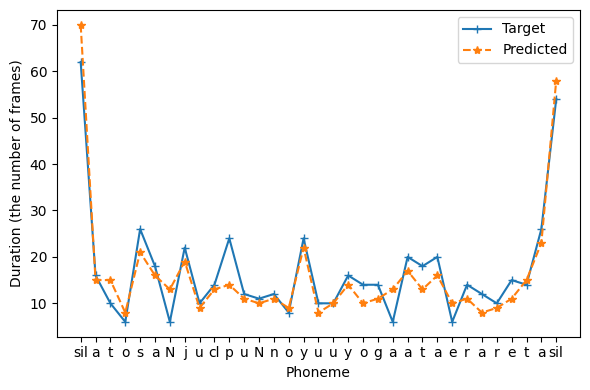

In [60]:
from ttslearn.util import lab2phonemes, find_lab, find_feats

labels = hts.load(find_lab("downloads/jsut_ver1.1/", test_utt))

# フルコンテキストラベルから音素のみを抽出
test_phonemes = lab2phonemes(labels)

# 言語特徴量の抽出に使うための質問ファイル
binary_dict, numeric_dict = hts.load_question_set(ttslearn.util.example_qst_file())

# 音素継続長の予測
durations_test = predict_duration(
    device, labels, duration_model, duration_config, duration_in_scaler, duration_out_scaler,
    binary_dict, numeric_dict)
durations_test_target = np.load(find_feats("dump/jsut_sr16000/org", test_utt, typ="out_duration"))

fig, ax = plt.subplots(1,1, figsize=(6,4))
ax.plot(durations_test_target, "-+", label="Target")
ax.plot(durations_test, "--*", label="Predicted")
ax.set_xticks(np.arange(len(test_phonemes)))
ax.set_xticklabels(test_phonemes)
ax.set_xlabel("Phoneme")
ax.set_ylabel("Duration (the number of frames)")
ax.legend()

plt.tight_layout()

# 図6-10
savefig("fig/dnntts_impl_duration_comp")

### 音響特徴量の予測

In [61]:
from ttslearn.dnntts.multistream import get_windows, multi_stream_mlpg

@torch.no_grad()
def predict_acoustic(
    device,  # CPU or GPU
    labels,  # フルコンテキストラベル
    acoustic_model,  # 学習済み音響モデル
    acoustic_config,  # 音響モデルの設定
    acoustic_in_scaler,  # 言語特徴量の正規化用 StandardScaler
    acoustic_out_scaler,  # 音響特徴量の正規化用 StandardScaler
    binary_dict,  # 二値特徴量を抽出する正規表現
    numeric_dict,  # 数値特徴量を抽出する正規表現
    mlpg=True,  # MLPG を使用するかどうか
):
    # フレーム単位の言語特徴量の抽出
    in_feats = fe.linguistic_features(
        labels,
        binary_dict,
        numeric_dict,
        add_frame_features=True,
        subphone_features="coarse_coding",
    )
    # 正規化
    in_feats = acoustic_in_scaler.transform(in_feats)

    # 音響特徴量の予測
    x = torch.from_numpy(in_feats).float().to(device).view(1, -1, in_feats.shape[-1])
    pred_acoustic = acoustic_model(x, [x.shape[1]]).squeeze(0).cpu().data.numpy()

    # 予測された音響特徴量に対して、正規化の逆変換を行います
    pred_acoustic = acoustic_out_scaler.inverse_transform(pred_acoustic)

    # パラメータ生成アルゴリズム (MLPG) の実行
    if mlpg and np.any(acoustic_config.has_dynamic_features):
        # (T, D_out) -> (T, static_dim)
        pred_acoustic = multi_stream_mlpg(
            pred_acoustic,
            acoustic_out_scaler.var_,
            get_windows(acoustic_config.num_windows),
            acoustic_config.stream_sizes,
            acoustic_config.has_dynamic_features,
        )

    return pred_acoustic

In [62]:
labels = hts.load(f"./downloads/jsut_ver1.1/basic5000/lab/{test_utt}.lab")

# 音響特徴量の予測
out_feats = predict_acoustic(
    device, labels, acoustic_model, acoustic_config, acoustic_in_scaler,
    acoustic_out_scaler, binary_dict, numeric_dict)

In [63]:
from ttslearn.util import trim_silence
from ttslearn.dnntts.multistream import split_streams

# 特徴量は、前処理で冒頭と末尾に非音声区間が切り詰められているので、比較のためにここでも同様の処理を行います
out_feats = trim_silence(out_feats, labels)
# 結合された特徴量を分離
mgc_gen, lf0_gen, vuv_gen, bap_gen = split_streams(out_feats, [40, 1, 1, 1])

In [64]:
# 比較用に、自然音声から抽出された音響特徴量を読み込みむ
feats = np.load(f"./dump/jsut_sr16000/org/eval/out_acoustic/{test_utt}-feats.npy")
# 特徴量の分離
mgc_ref, lf0_ref, vuv_ref, bap_ref = get_static_features(
    feats, acoustic_config.num_windows, acoustic_config.stream_sizes, acoustic_config.has_dynamic_features)

### 音声波形の生成

In [65]:
from nnmnkwii.postfilters import merlin_post_filter
from ttslearn.dnntts.multistream import get_static_stream_sizes

def gen_waveform(
    sample_rate,  # サンプリング周波数
    acoustic_features,  # 音響特徴量
    stream_sizes,  # ストリームサイズ
    has_dynamic_features,  # 音響特徴量が動的特徴量を含むかどうか
    num_windows=3,  # 動的特徴量の計算に使う窓数
    post_filter=False,  # フォルマント強調のポストフィルタを使うかどうか
):
    # 静的特徴量の次元数を取得
    if np.any(has_dynamic_features):
        static_stream_sizes = get_static_stream_sizes(
            stream_sizes, has_dynamic_features, num_windows
        )
    else:
        static_stream_sizes = stream_sizes

    # 結合された音響特徴量をストリーム毎に分離
    mgc, lf0, vuv, bap = split_streams(acoustic_features, static_stream_sizes)

    fftlen = pyworld.get_cheaptrick_fft_size(sample_rate)
    alpha = pysptk.util.mcepalpha(sample_rate)

    # フォルマント強調のポストフィルタ
    if post_filter:
        mgc = merlin_post_filter(mgc, alpha)

    # 音響特徴量を音声パラメータに変換
    spectrogram = pysptk.mc2sp(mgc, fftlen=fftlen, alpha=alpha)
    aperiodicity = pyworld.decode_aperiodicity(
        bap.astype(np.float64), sample_rate, fftlen
    )
    f0 = lf0.copy()
    f0[vuv < 0.5] = 0
    f0[np.nonzero(f0)] = np.exp(f0[np.nonzero(f0)])

    # WORLD ボコーダを利用して音声生成
    gen_wav = pyworld.synthesize(
        f0.flatten().astype(np.float64),
        spectrogram.astype(np.float64),
        aperiodicity.astype(np.float64),
        sample_rate,
    )

    return gen_wav

### すべてのモデルを組み合わせて音声波形の生成

In [66]:
labels = hts.load(f"./downloads/jsut_ver1.1/basic5000/lab/{test_utt}.lab")

binary_dict, numeric_dict = hts.load_question_set(ttslearn.util.example_qst_file())

# 音素継続長の予測
durations = predict_duration(
    device, labels, duration_model, duration_config, duration_in_scaler, duration_out_scaler,
    binary_dict, numeric_dict)

# 予測された継続長をフルコンテキストラベルに設定
labels.set_durations(durations)

# 音響特徴量の予測
out_feats = predict_acoustic(
    device, labels, acoustic_model, acoustic_config, acoustic_in_scaler,
    acoustic_out_scaler, binary_dict, numeric_dict)

# 音声波形の生成
gen_wav = gen_waveform(
    sr, out_feats,
    acoustic_config.stream_sizes,
    acoustic_config.has_dynamic_features,
    acoustic_config.num_windows,
    post_filter=False,
)

自然音声


DNN音声合成


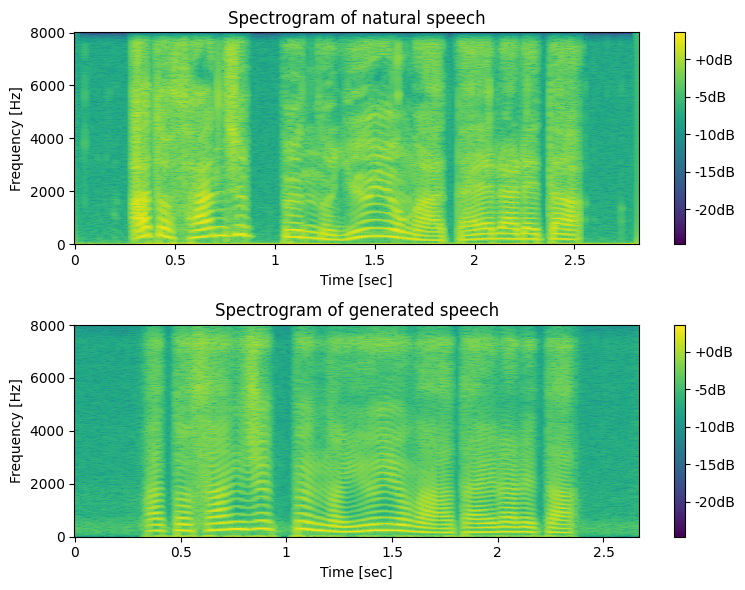

In [68]:
# 比較用に元音声の読み込み
_sr, ref_wav = wavfile.read(f"./downloads/jsut_ver1.1/basic5000/wav/{test_utt}.wav")
ref_wav = (ref_wav / 32768.0).astype(np.float64)
ref_wav = librosa.resample(ref_wav, orig_sr=_sr, target_sr=sr)

# スペクトログラムを計算
spec_ref = librosa.stft(ref_wav, n_fft=fft_size, hop_length=hop_length, window="hann")
logspec_ref = np.log(np.abs(spec_ref))
spec_gen = librosa.stft(gen_wav, n_fft=fft_size, hop_length=hop_length, window="hann")
logspec_gen = np.log(np.abs(spec_gen))

mindb = min(logspec_ref.min(), logspec_gen.min())
maxdb = max(logspec_ref.max(), logspec_gen.max())

fig, ax = plt.subplots(2, 1, figsize=(8,6))
mesh = librosa.display.specshow(logspec_ref, hop_length=hop_length, sr=sr, cmap=cmap, x_axis="time", y_axis="hz", ax=ax[0])
mesh.set_clim(mindb, maxdb)
fig.colorbar(mesh, ax=ax[0], format="%+2.fdB")

mesh = librosa.display.specshow(logspec_gen, hop_length=hop_length, sr=sr, cmap=cmap, x_axis="time", y_axis="hz", ax=ax[1])
mesh.set_clim(mindb, maxdb)
fig.colorbar(mesh, ax=ax[1], format="%+2.fdB")

for a in ax:
    a.set_xlabel("Time [sec]")
    a.set_ylabel("Frequency [Hz]")

ax[0].set_title("Spectrogram of natural speech")
ax[1].set_title("Spectrogram of generated speech")

plt.tight_layout()

print("自然音声")
IPython.display.display(Audio(ref_wav, rate=sr))
print("DNN音声合成")
IPython.display.display(Audio(gen_wav, rate=sr))

# 図6-13
savefig("./fig/dnntts_impl_tts_spec_comp")

### 評価データに対して音声波形生成

In [71]:
# レシピのstage 6の実行
if run_sh:
    ! ./run.sh --stage 6 --stop-stage 6 --duration-model $duration_config_name --acoustic-model $acoustic_config_name \
    --tqdm $run_sh_tqdm

stage 6: Synthesis waveforms
+ python synthesis.py utt_list=./data/eval.list tqdm=none in_dir=downloads/jsut_ver1.1/basic5000/lab/ out_dir=exp/jsut_sr16000/synthesis_duration_dnn_acoustic_dnn_sr16k/eval sample_rate=16000 qst_path=../common/qst1.hed duration.checkpoint=exp/jsut_sr16000/duration_dnn/latest.pth duration.in_scaler_path=dump/jsut_sr16000/norm/in_duration_scaler.joblib duration.out_scaler_path=dump/jsut_sr16000/norm/out_duration_scaler.joblib duration.model_yaml=exp/jsut_sr16000/duration_dnn/model.yaml acoustic.checkpoint=exp/jsut_sr16000/acoustic_dnn_sr16k/latest.pth acoustic.in_scaler_path=dump/jsut_sr16000/norm/in_acoustic_scaler.joblib acoustic.out_scaler_path=dump/jsut_sr16000/norm/out_acoustic_scaler.joblib acoustic.model_yaml=exp/jsut_sr16000/acoustic_dnn_sr16k/model.yaml post_filter=true reverse=false num_eval_utts=-1
/content/recipes/dnntts/synthesis.py:85: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or No